Шаг 1. генерация кварталов

In [ ]:
!pip install blocksnet ipykernel -q

In [ ]:
!pip install folium matplotlib mapclassify

In [ ]:
import geopandas as gpd

boundary = gpd.read_file('/content/boundary.geojson')
roads = gpd.read_file('/content/road_2.geojson')
water = gpd.read_file('/content/water.geojson')

In [ ]:
tags = {
    'roads': {
      "highway": ["construction","crossing","living_street","motorway","motorway_link","motorway_junction","pedestrian","primary","primary_link","raceway","residential","road","secondary","secondary_link","services","tertiary","tertiary_link","track","trunk","trunk_link","turning_circle","turning_loop","unclassified",],
      "service": ["living_street", "emergency_access"]
    },
    'railways': {
      "railway": "rail"
    },
    'water': {
      'riverbank':True,
      'reservoir':True,
      'basin':True,
      'dock':True,
      'canal':True,
      'pond':True,
      'natural':['water','bay'],
      'waterway':['river','canal','ditch'],
      'landuse':'basin',
      'water': 'lake'
    }
}

In [ ]:
local_crs = boundary.estimate_utm_crs()

In [ ]:
boundary = boundary.reset_index()[['geometry']].to_crs(local_crs)
water = water.reset_index()[['geometry']].to_crs(local_crs)
roads = roads.reset_index()[['geometry']].to_crs(local_crs)
# railways = railways.reset_index()[['geometry']].to_crs(local_crs)

In [ ]:
roads = roads[roads.geom_type.isin(['LineString', 'MultiLineString'])]

In [ ]:
import momepy
GAP_TOLERANCE = 1
def _get_roads(roads):
    merged = roads.unary_union
    if merged.geom_type == 'MultiLineString':
        roads = gpd.GeoDataFrame(geometry=list(merged.geoms), crs=roads.crs)
    else:
        roads = gpd.GeoDataFrame(geometry=[merged], crs=roads.crs)
    roads = roads.explode(index_parts=False).reset_index(drop=True)
    roads.geometry = momepy.close_gaps(roads, GAP_TOLERANCE)
    roads = roads[roads.geom_type.isin(['LineString'])]
    return roads

roads = _get_roads(roads)
roads


,geometry
0,"LINESTRING (331951.025 6583259.484, 332056.828..."
1,"LINESTRING (332056.828 6583361.568, 332138.656..."
2,"LINESTRING (331951.025 6583259.484, 331784.628..."
3,"LINESTRING (331784.628 6583434.133, 331902.265..."
4,"LINESTRING (331951.025 6583259.484, 331888.394..."
...,...
1202,"LINESTRING (332842.433 6582729.656, 332837.310..."
1203,"LINESTRING (333255.474 6582867.544, 333260.812..."
1204,"LINESTRING (332050.681 6582009.544, 332080.196..."
1205,"LINESTRING (332451.377 6582624.378, 332373.737..."


Импортируем класс `BlocksGenerator` и инициализируем его экземпляр с помощью наших геометрий. На этапе инициализации:
- все геометрии проверяются по спецификации (можете увидеть при наведении курсора на BlocksGenerator);
- из геометрии границ территории удаляются полигоны водных объектов.

In [ ]:
from blocksnet import BlocksGenerator

bg = BlocksGenerator(boundary, roads, None, water)

2024-12-20 21:52:29.608 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:99 - Check boundaries schema
2024-12-20 21:52:29.644 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:103 - Check roads schema
2024-12-20 21:52:29.658 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:109 - Check railways schema
2024-12-20 21:52:29.667 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:115 - Check water schema
2024-12-20 21:52:29.679 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:124 - Exclude water objects


In [ ]:
blocks = bg.run()

2024-12-20 21:52:31.851 | INFO     | blocksnet.preprocessing.blocks_generator:run:161 - Generating blocks
2024-12-20 21:52:31.869 | INFO     | blocksnet.preprocessing.blocks_generator:run:170 - Setting up enclosures
2024-12-20 21:52:31.963 | INFO     | blocksnet.preprocessing.blocks_generator:run:174 - Filling holes
2024-12-20 21:52:32.002 | INFO     | blocksnet.preprocessing.blocks_generator:run:178 - Dropping overlapping blocks
2024-12-20 21:52:32.055 | INFO     | blocksnet.preprocessing.blocks_generator:run:192 - Calculating blocks area
2024-12-20 21:52:32.066 | INFO     | blocksnet.preprocessing.blocks_generator:run:199 - Blocks generated


С помощью библиотеки mapclassify мы можем выводить геометрии на карту через `.explore()`.

In [ ]:
blocks.explore()

In [ ]:
!pip install mapclassify -q

In [ ]:
import geopandas as gpd
buildings = gpd.read_file("/content/building_g_2.geojson")

In [ ]:
buildings.explore()

In [ ]:
buildings = buildings.to_crs(local_crs).reset_index()[['geometry']]
buildings.geometry = buildings.representative_point()

In [ ]:
from blocksnet import BlocksSplitter

bs = BlocksSplitter(blocks, buildings)

In [ ]:
splitted_blocks = bs.run()

2024-12-20 21:52:54.906 | INFO     | blocksnet.preprocessing.blocks_splitter:run:167 - Joining buildings and blocks to exclude duplicates
2024-12-20 21:52:55.073 | INFO     | blocksnet.preprocessing.blocks_splitter:run:176 - Choosing blocks to be splitted
2024-12-20 21:52:55.209 | INFO     | blocksnet.preprocessing.blocks_splitter:run:185 - Splitting filtered blocks
100%|██████████| 6/6 [00:05<00:00,  1.16it/s]


In [ ]:
len(blocks), len(splitted_blocks)

(317, 337)

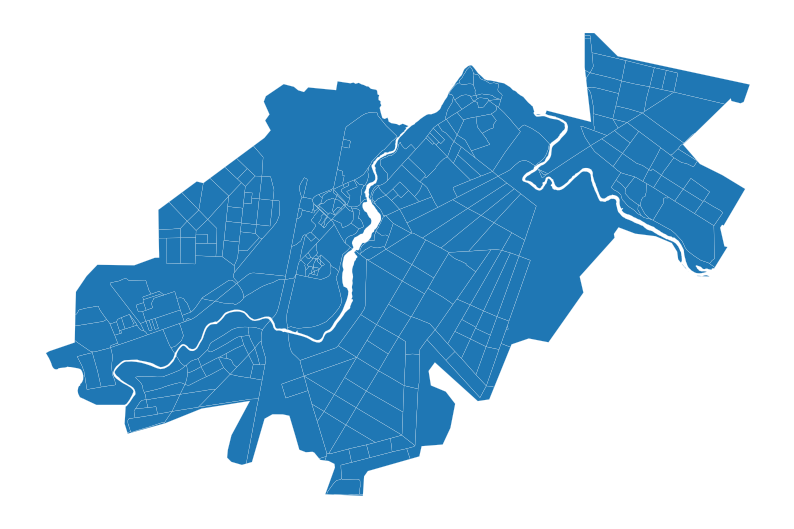

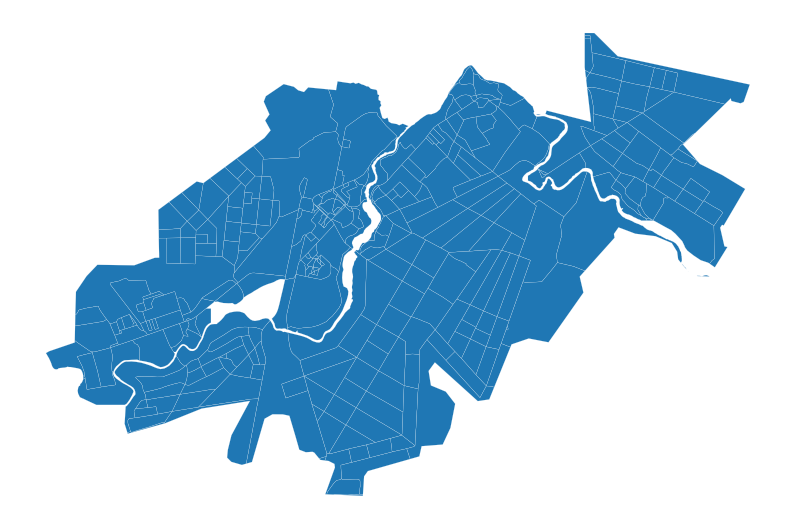

In [ ]:
blocks.plot(linewidth=0.1, figsize=(10,10)).set_axis_off()
splitted_blocks.plot(linewidth=0.1, figsize=(10,10)).set_axis_off()

In [ ]:
splitted_blocks.to_file('blocks.geojson')

Шаг 2. Генерация графов, расчет доступности и связанности территории

In [ ]:
!pip install iduedu

In [ ]:
boundary.to_crs(4326, inplace=True)

In [ ]:
!pip install momepy
import momepy

In [ ]:
CRS = 32636
SPEED_M_MIN = 1000

import networkx as nx

def _roads_to_graph(roads):
    graph = momepy.gdf_to_nx(roads)
    graph.graph['crs'] = roads.crs.to_epsg()
    graph = nx.DiGraph(graph)
    for _, _, data in graph.edges(data=True):
        geometry = data['geometry']
        data['time_min'] = geometry.length / SPEED_M_MIN
        # data['weight'] = data['mm_len'] / 1000 / 1000
        # data['length_meter'] = data['mm_len'] / 1000
    for n, data in graph.nodes(data=True):
        graph.nodes[n]['x'] = n[0]  # Assign X coordinate to node
        graph.nodes[n]['y'] = n[1]

    return graph

roads_G = _roads_to_graph(roads)
roads_G

In [ ]:
from blocksnet import AccessibilityProcessor
AccessibilityProcessor._fix_graph(roads_G)

from blocksnet import AccessibilityProcessor

ap = AccessibilityProcessor(blocks)
acc_mx = ap.get_accessibility_matrix(roads_G)
acc_mx.head() # вывод первых 5 строк полученной матрицы

,0,1,2,3,4,5,6,7,8,9,...,307,308,309,310,311,312,313,314,315,316
0,0.000000,0.625488,0.146973,0.241211,0.146973,0.091919,0.307129,3.031250,0.307129,0.647949,...,5.121094,5.015625,7.019531,3.253906,3.039062,4.847656,5.933594,7.484375,7.425781,7.425781
1,0.625488,0.000000,0.478760,0.847168,0.478760,0.717773,0.932617,3.052734,0.932617,0.638184,...,5.140625,5.035156,7.039062,3.275391,3.058594,4.867188,5.953125,7.503906,7.445312,7.445312
2,0.146973,0.478760,0.000000,0.368408,0.000000,0.238892,0.454102,2.914062,0.454102,0.501465,...,5.003906,4.898438,6.902344,3.136719,2.921875,4.730469,5.816406,7.367188,7.308594,7.308594
3,0.241211,0.847168,0.368408,0.000000,0.368408,0.333252,0.446777,3.273438,0.446777,0.869629,...,5.363281,5.257812,7.261719,3.496094,3.281250,5.089844,6.175781,7.722656,7.664062,7.664062
4,0.146973,0.478760,0.000000,0.368408,0.000000,0.238892,0.454102,2.914062,0.454102,0.501465,...,5.003906,4.898438,6.902344,3.136719,2.921875,4.730469,5.816406,7.367188,7.308594,7.308594


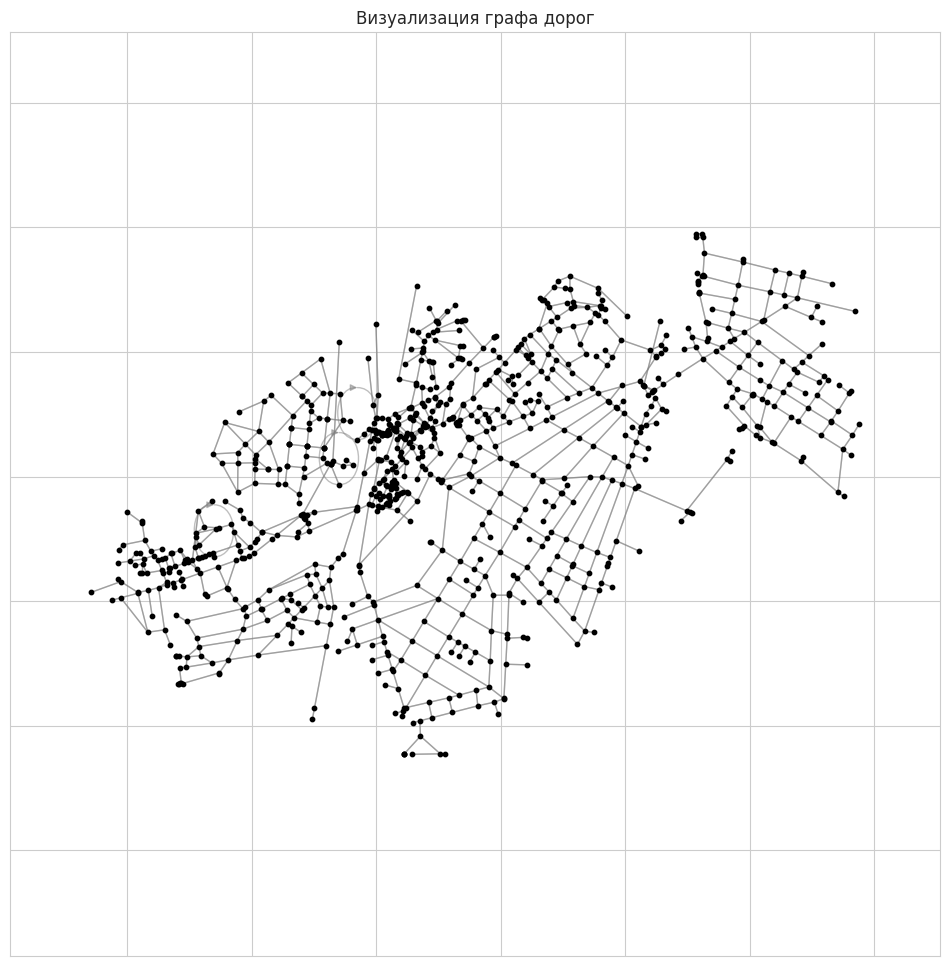

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Предполагаем, что roads_G уже создан и обработан
# Визуализация графа
plt.figure(figsize=(12, 12))
pos = {n: (data['x'], data['y']) for n, data in roads_G.nodes(data=True)}  # Получаем позиции узлов

# Рисуем рёбра без стрелок
nx.draw_networkx_edges(roads_G, pos, alpha=0.5, edge_color='grey', arrows=False)

# Рисуем узлы
nx.draw_networkx_nodes(roads_G, pos, node_color='black', node_size=10)

# Добавляем подписи узлов (если необходимо)
# nx.draw_networkx_labels(roads_G, pos, font_size=8)

plt.title("Визуализация графа дорог")
plt.axis('equal')  # Сохраняем пропорции
plt.show()


In [ ]:
from blocksnet.models import City
from blocksnet import Accessibility, Connectivity

blocks['land_use'] = None

city = City(
    blocks=blocks,
    acc_mx=acc_mx
)

connectivity = Connectivity(city_model=city)
connectivity_result = connectivity.calculate()
connectivity_result

,geometry,connectivity
id,,
0,"POLYGON ((331951.025 6583259.484, 332056.828 6...",3.654297
1,"POLYGON ((332056.828 6583361.568, 331951.025 6...",3.673828
2,"POLYGON ((332138.656 6583276.050, 332056.828 6...",3.537109
3,"POLYGON ((331784.629 6583434.132, 331951.025 6...",3.896484
4,"POLYGON ((332056.828 6583361.568, 331902.265 6...",3.537109
...,...,...
312,"POLYGON ((334358.804 6584499.433, 334318.050 6...",2.765625
313,"POLYGON ((335131.537 6584233.771, 335118.834 6...",3.169922
314,"POLYGON ((336698.537 6582761.252, 336705.650 6...",4.718750


In [ ]:
connectivity_result.explore()

In [ ]:
from blocksnet.models import City
blocks['land_use'] = None
city = City(
    blocks=blocks,
    acc_mx=acc_mx
)

In [ ]:
from blocksnet import Accessibility, Connectivity

In [ ]:
accessibility = Accessibility(city_model=city)
block = city[2] # квартал от которого будем считать доступность
result = accessibility.calculate(block)

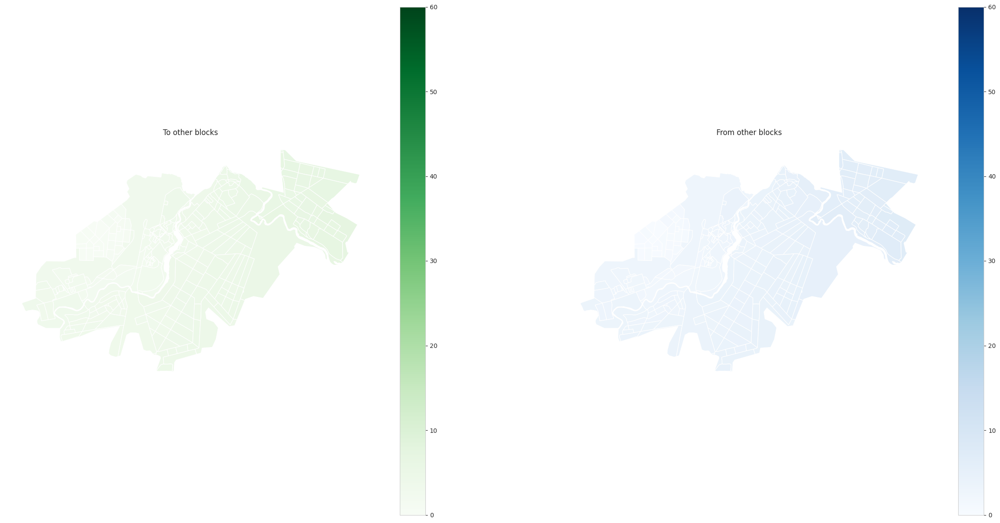

In [ ]:
Accessibility.plot(result, linewidth=0.9, figsize=(30,15))

In [ ]:
connectivity = Connectivity(city_model=city)
connectivity_result = connectivity.calculate()

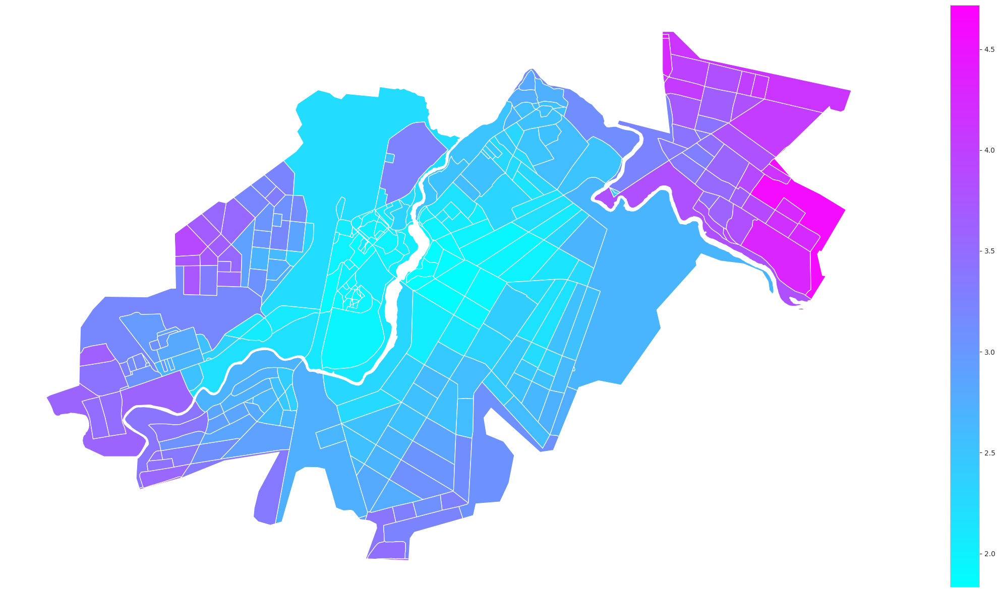

In [ ]:
Connectivity.plot(connectivity_result, linewidth=0.9, figsize=(30,15))

In [ ]:
import geopandas as gpd
buildings = gpd.read_file("/content/building_g_2.geojson")

In [ ]:
buildings = buildings.to_crs(local_crs) # переводим здания в локальную систему координат

In [ ]:
buildings = buildings[buildings.geometry.type.isin(['Polygon', 'MultiPolygon'])]

In [ ]:
buildings = buildings.reset_index(drop=True)

In [ ]:
buildings

,osm_id,building:levels,addr:street,addr:housenumber,is_living,living_area,population,building,geometry
0,93368190,5,улица Строителей,24,1,3615.25,74.0,residential,"MULTIPOLYGON (((333064.785 6582759.243, 333129..."
1,93368632,5,улица Строителей,26,1,3598.35,74.0,residential,"MULTIPOLYGON (((333146.490 6582753.910, 333160..."
2,93369316,5,улица Строителей,20,1,3614.40,73.0,residential,"MULTIPOLYGON (((333031.497 6582797.564, 333041..."
3,93369324,5,улица Строителей,10,1,3620.10,68.0,residential,"MULTIPOLYGON (((333110.276 6582881.216, 333160..."
4,93369328,5,улица Строителей,12,1,3631.28,64.0,residential,"MULTIPOLYGON (((333068.731 6582856.924, 333115..."
...,...,...,...,...,...,...,...,...,...
3641,None,2,None,None,1,NaN,12.0,residential,"MULTIPOLYGON (((332337.912 6583720.532, 332369..."
3642,None,1,None,None,1,NaN,12.0,residential,"MULTIPOLYGON (((332480.857 6583803.643, 332438..."
3643,None,1,None,None,1,NaN,12.0,residential,"MULTIPOLYGON (((332530.781 6583755.946, 332487..."
3644,None,1,None,None,1,NaN,30.0,residential,"MULTIPOLYGON (((332530.191 6583906.812, 332544..."


In [ ]:
import pandas as pd

# Преобразуем столбец 'building:levels' в числовой тип, ошибки будут заменены на NaN
buildings['building:levels'] = pd.to_numeric(buildings['building:levels'], errors='coerce')

# Заполним пропущенные значения (NaN) нулями или другими подходящими значениями
buildings = buildings.fillna(0)

# Добавляем или преобразуем необходимые атрибуты

# 1. Количество этажей (number_of_floors)
buildings['number_of_floors'] = buildings['building:levels']

# 2. Площадь застройки (footprint_area) - как площадь геометрии (основание здания)
buildings['footprint_area'] = buildings.geometry.area

# 3. Общая площадь всех этажей (build_floor_area) - footprint_area * number_of_floors
buildings['build_floor_area'] = buildings['footprint_area'] * buildings['number_of_floors']

# 4. Жилая площадь (living_area) и нежилая площадь (non_living_area)
# Жилая площадь будет рассчитываться только для жилых зданий
residential_tags = ['residential']
buildings['living_area'] = buildings.apply(
    lambda x: 0.8 * x['build_floor_area'] if x['building'] in residential_tags else 0,
    axis=1
)

# Нежилая площадь будет 20% от общей площади этажей
buildings['non_living_area'] = buildings['build_floor_area'] - buildings['living_area']

# 5. Население (population) - для жилых зданий
buildings['population'] = buildings['population']


# Теперь удалим все остальные столбцы, кроме 'geometry', 'build_floor_area', 'living_area', 'non_living_area',
# 'footprint_area', 'number_of_floors', 'population'
buildings = buildings[['geometry', 'build_floor_area', 'living_area', 'non_living_area',
                       'footprint_area', 'number_of_floors', 'population']]

# Проверим результат
buildings

,geometry,build_floor_area,living_area,non_living_area,footprint_area,number_of_floors,population
0,"MULTIPOLYGON (((333064.785 6582759.243, 333129...",5072.965798,4058.372639,1014.593160,1014.593160,5,74.0
1,"MULTIPOLYGON (((333146.490 6582753.910, 333160...",5229.308040,4183.446432,1045.861608,1045.861608,5,74.0
2,"MULTIPOLYGON (((333031.497 6582797.564, 333041...",5101.592419,4081.273935,1020.318484,1020.318484,5,73.0
3,"MULTIPOLYGON (((333110.276 6582881.216, 333160...",5185.880914,4148.704731,1037.176183,1037.176183,5,68.0
4,"MULTIPOLYGON (((333068.731 6582856.924, 333115...",5214.881127,4171.904901,1042.976225,1042.976225,5,64.0
...,...,...,...,...,...,...,...
3641,"MULTIPOLYGON (((332337.912 6583720.532, 332369...",1780.983074,1424.786459,356.196615,890.491537,2,12.0
3642,"MULTIPOLYGON (((332480.857 6583803.643, 332438...",1095.575551,876.460441,219.115110,1095.575551,1,12.0
3643,"MULTIPOLYGON (((332530.781 6583755.946, 332487...",1095.601346,876.481077,219.120269,1095.601346,1,12.0
3644,"MULTIPOLYGON (((332530.191 6583906.812, 332544...",3402.079211,2721.663369,680.415842,3402.079211,1,30.0


In [ ]:
buildings.explore()


In [ ]:
city.update_buildings(buildings)

2024-12-20 21:54:06.506 | INFO     | blocksnet.models.city:update_buildings:1237 - Removing existing blocks from the model
2024-12-20 21:54:06.510 | INFO     | blocksnet.models.city:update_buildings:1241 - Joining buildings and blocks
Update blocks buildings: 100%|██████████| 240/240 [00:01<00:00, 155.02it/s]


,geometry,build_floor_area,living_area,non_living_area,footprint_area,number_of_floors,population


Шаг 3. Анализ обеспеченности сервисами

In [ ]:
from tqdm.auto import tqdm

def remove_inner_polygons(gdf_polygons):
    to_remove = []
    print(len(gdf_polygons))
    for idx, poly1 in tqdm(gdf_polygons.iterrows()):
        for idx2, poly2 in gdf_polygons.iterrows():
            if idx != idx2 and poly1.geometry.contains(poly2.geometry):
                to_remove.append(idx2)
    return gdf_polygons.drop(to_remove)

# Шаг 3: Удаляем близкие центроиды, оставляя одну точку на буфер
def remove_close_centroids(gdf_centroids, buffer_distance=60):
    # Создаем новый GeoDataFrame для хранения итоговых точек
    final_centroids = gpd.GeoDataFrame(columns=gdf_centroids.columns, crs=gdf_centroids.crs)

    # Итерируем по всем точкам
    while not gdf_centroids.empty:
        # Берем первую точку
        current_point = gdf_centroids.iloc[0]

        # Создаем буфер вокруг этой точки
        buffer = current_point.geometry.buffer(buffer_distance)

        # Находим все точки, которые попадают в этот буфер
        close_points = gdf_centroids[gdf_centroids.geometry.within(buffer)]

        # Добавляем одну (например, первую) точку в итоговый результат с помощью concat
        final_centroids = gpd.GeoDataFrame(
            pd.concat([final_centroids, gpd.GeoDataFrame([current_point])], ignore_index=True)
        )

        # Удаляем все точки, попавшие в этот буфер, из исходного списка
        gdf_centroids = gdf_centroids.drop(close_points.index)

    return final_centroids

In [ ]:
import os
import geopandas as gpd
from shapely.geometry import Point
from blocksnet import ServiceType

directory = os.fsencode("/content/servises/")
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".geojson"):
        service_name = filename.removesuffix(".geojson")
        print(f"Adding service {service_name}")
        service_gdf = gpd.read_file("/content/servises/" + filename)
        service_gdf.to_crs(local_crs, inplace=True)
        service = remove_inner_polygons(service_gdf)
        service['geometry'] = service.centroid
        service = remove_close_centroids(service)
        service = service[["geometry"]]
        try:
          city.update_services(service_name, service)
        except:
          continue
    else:
        continue

Adding service library
1


0it [00:00, ?it/s]

Adding service community_centre
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service lawyer
2


<ipython-input-182-693f2aaf9604>:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat([final_centroids, gpd.GeoDataFrame([current_point])], ignore_index=True)
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service social_facility
2


0it [00:00, ?it/s]

Adding service religion
5


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service laboratory
1


0it [00:00, ?it/s]

Adding service fuel
5


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service shoemaker
2


0it [00:00, ?it/s]

Adding service attraction
42


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service shop_pets
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service recycling
6


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service bakery
8


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

0it [00:00, ?it/s]

<ipython-input-182-693f2aaf9604>:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat([final_centroids, gpd.GeoDataFrame([current_point])], ignore_index=True)
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/ge

Adding service mall
6


0it [00:00, ?it/s]

<ipython-input-182-693f2aaf9604>:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat([final_centroids, gpd.GeoDataFrame([current_point])], ignore_index=True)
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/ge

Adding service houseware
4


0it [00:00, ?it/s]

Adding service kindergarten
13


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service car_repair
2


0it [00:00, ?it/s]

Adding service train_building
1


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service driving_school
1


0it [00:00, ?it/s]

Adding service parking
22


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service hairdresser
9


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service cinema
1


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service pharmacy
11


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service emergency
1


0it [00:00, ?it/s]

Adding service post_office
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service electronic
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service cemetery
3


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service park
4


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service estate_agent
4


0it [00:00, ?it/s]

Adding service veterinary
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service dentist
1


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service florist
4


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service bank
3


0it [00:00, ?it/s]

<ipython-input-182-693f2aaf9604>:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat([final_centroids, gpd.GeoDataFrame([current_point])], ignore_index=True)
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/ge

Adding service train_station
1


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service polyclinic
1


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service clothes
2


0it [00:00, ?it/s]

Adding service outpost
11


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service cafe
9


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service insurance
3


0it [00:00, ?it/s]

Adding service atm
7


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service government
3


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service university
1


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service college
1


0it [00:00, ?it/s]

Adding service bus_stop
67


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service sport_centre
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

0it [00:00, ?it/s]

Adding service notary
1


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service pitch
11


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service tobacco
2


0it [00:00, ?it/s]

Adding service copyshop
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service mfz
1


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service school
7


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service hotel
2


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service beach
12


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service police
2


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service landfill
1


0it [00:00, ?it/s]

Adding service books
1


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service fire station
1


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service museum
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

<ipython-input-182-693f2aaf9604>:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat([final_centroids, gpd.GeoDataFrame([current_point])], ignore_index=True)
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Adding service funeral_directors
3


0it [00:00, ?it/s]

Adding service public_bath
2


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

Adding service supermarket
20


/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service convenience
10


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

Adding service playground
29


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1470: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 36N (the single n

In [ ]:
from blocksnet import LandUsePrediction # импортируем модуль

lup = LandUsePrediction(city_model=city)
lu_blocks = lup.calculate()
lu_blocks.head()

100%|██████████| 317/317 [00:03<00:00, 85.45it/s]


,geometry,land_use
id,,
0,"POLYGON ((331951.025 6583259.484, 332056.828 6...",RESIDENTIAL
1,"POLYGON ((332056.828 6583361.568, 331951.025 6...",RESIDENTIAL
2,"POLYGON ((332138.656 6583276.050, 332056.828 6...",RECREATION
3,"POLYGON ((331784.629 6583434.132, 331951.025 6...",RESIDENTIAL
4,"POLYGON ((332056.828 6583361.568, 331902.265 6...",None


In [ ]:
city.update_land_use(lu_blocks)

<Axes: >

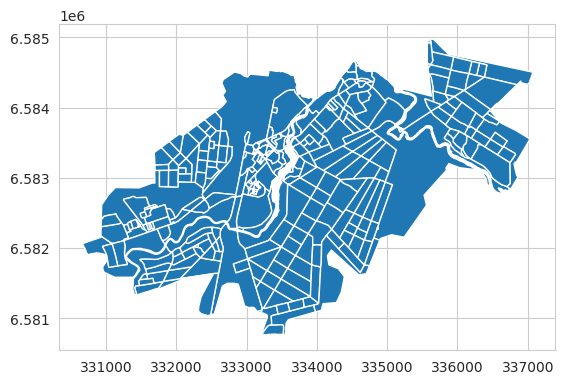

In [ ]:
blocks.plot()

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'school'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

2024-12-20 22:02:46.356 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 15 : 204x6
2024-12-20 22:02:46.875 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:02:46.935 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:02:47.112 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


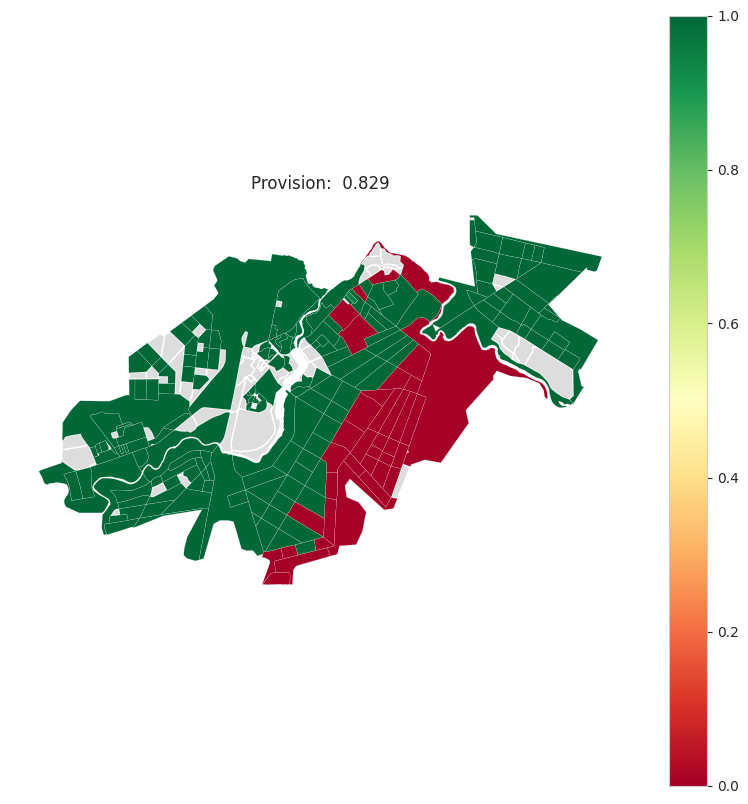

In [ ]:
prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'polyclinic'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

2024-12-20 22:02:59.679 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 10 : 204x1
2024-12-20 22:02:59.712 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:02:59.742 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:02:59.851 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


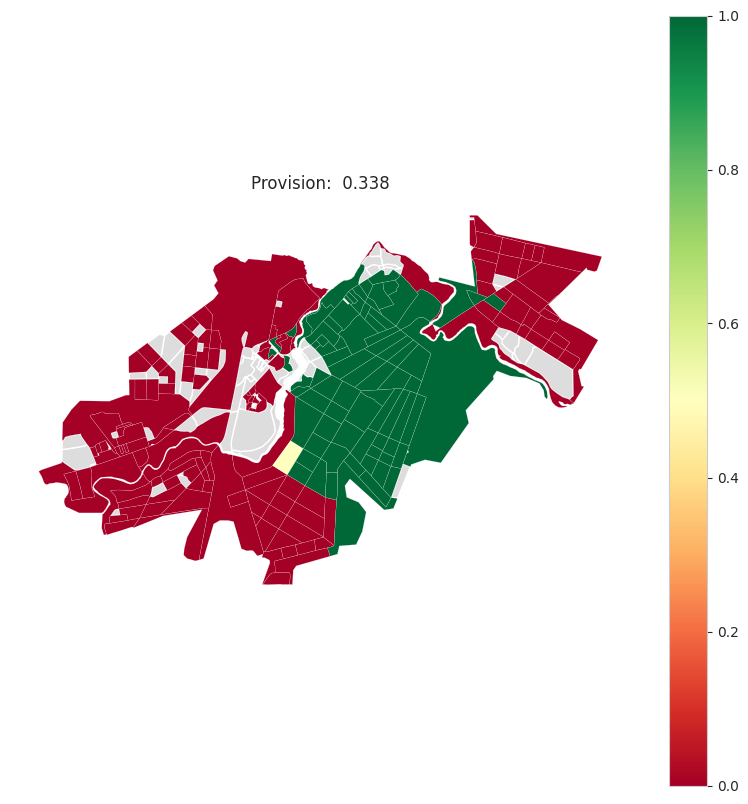

In [ ]:
prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

2024-12-20 22:03:06.017 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 10 : 204x6
2024-12-20 22:03:06.104 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:03:06.159 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:03:06.372 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


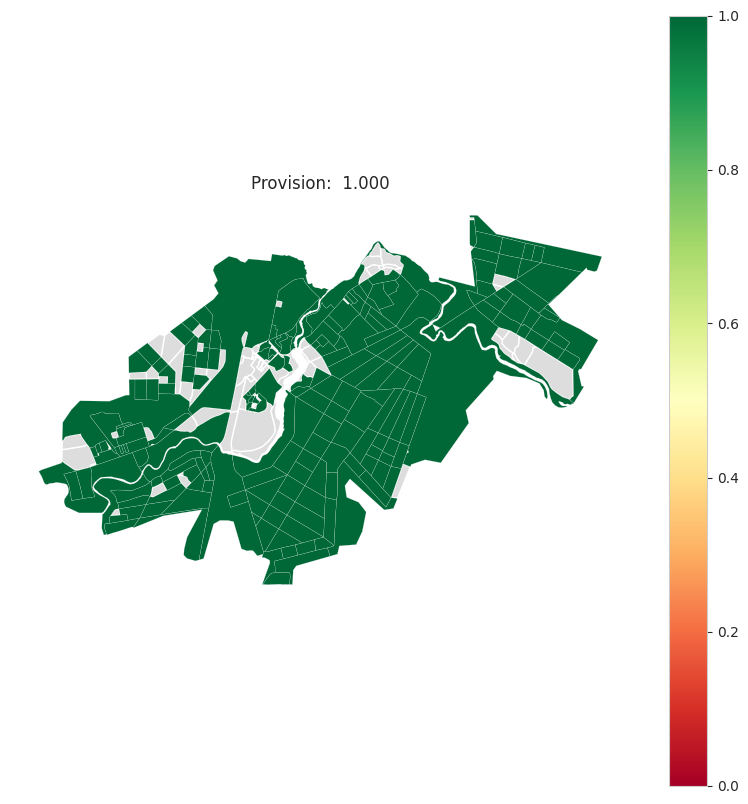

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'bakery'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

2024-12-20 22:03:10.180 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 30 : 204x2
2024-12-20 22:03:10.213 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:03:10.244 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:03:10.431 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


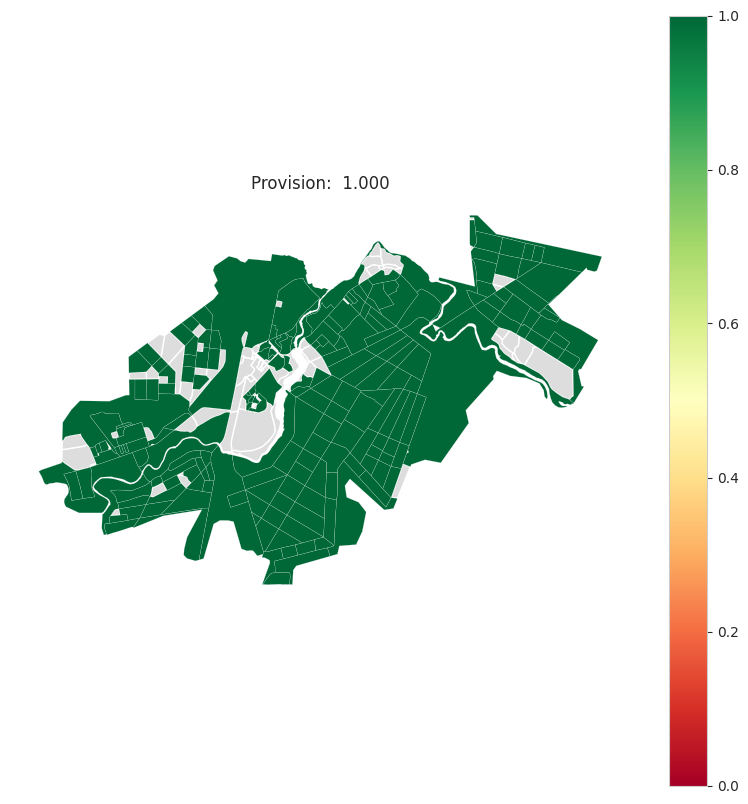

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'bank'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

2024-12-20 22:03:17.999 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 60 : 204x5
2024-12-20 22:03:18.072 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:03:18.118 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:03:18.320 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


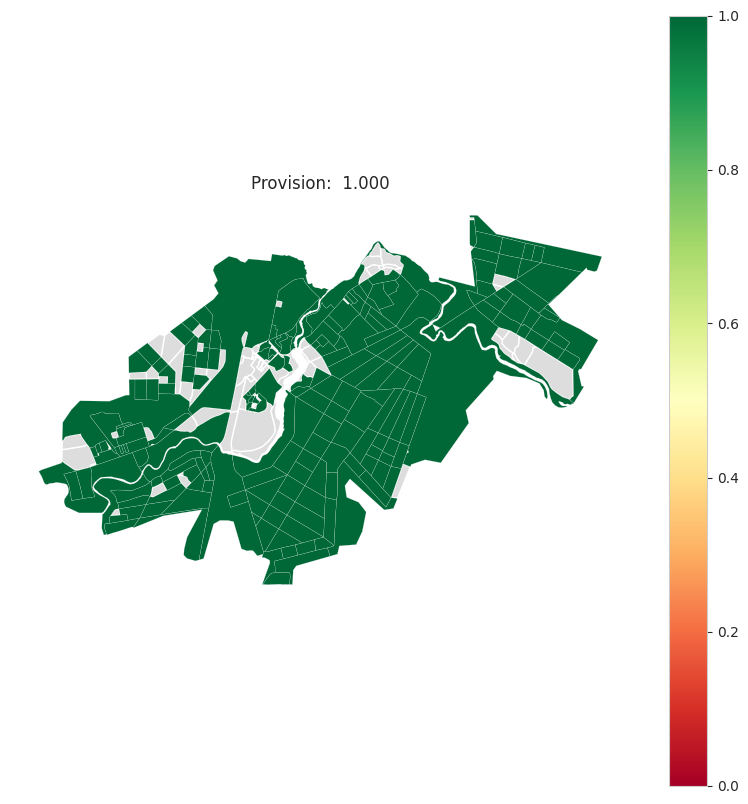

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'beach'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

2024-12-20 22:03:21.940 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 6 : 204x16
2024-12-20 22:03:22.160 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:03:22.274 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:03:22.397 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


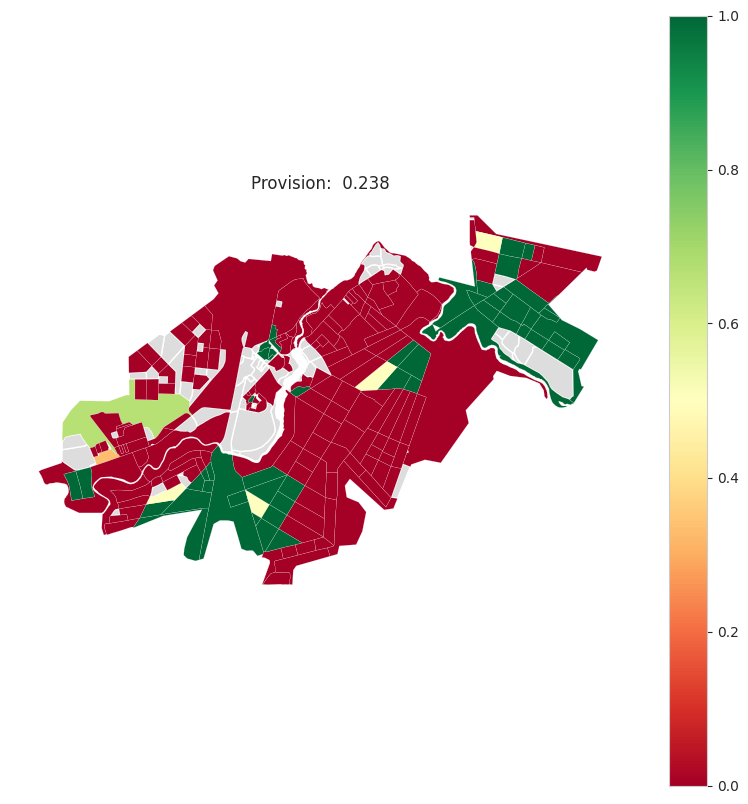

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'bus_stop'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

2024-12-20 22:03:25.330 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 15 : 204x8
2024-12-20 22:03:25.521 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:03:25.617 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:03:25.842 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


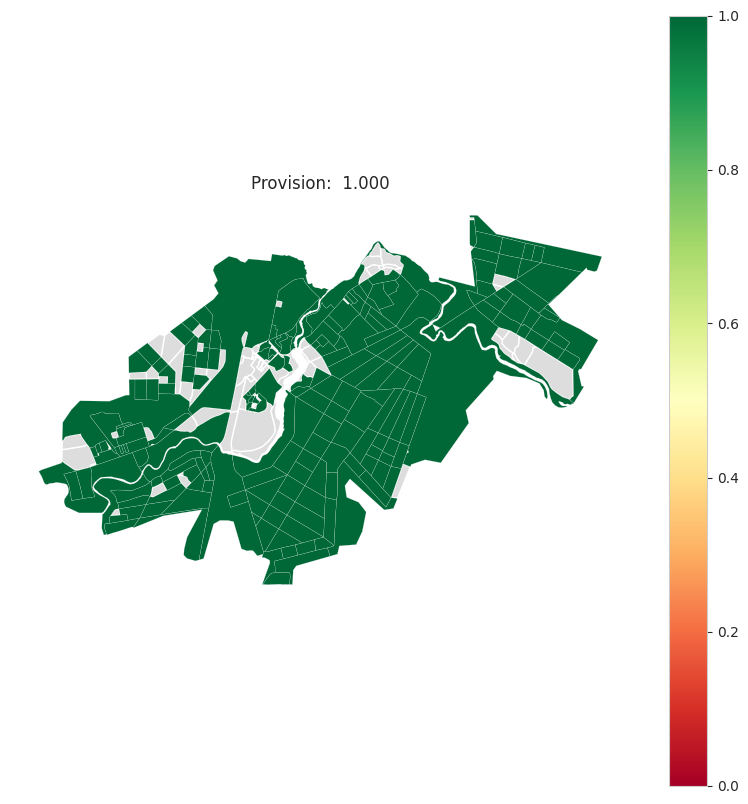

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'cafe'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'library'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

KeyError: "Can't find service type with such name: library"

2024-12-20 22:26:05.220 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 40 : 204x1
2024-12-20 22:26:05.268 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-20 22:26:05.303 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-20 22:26:05.355 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


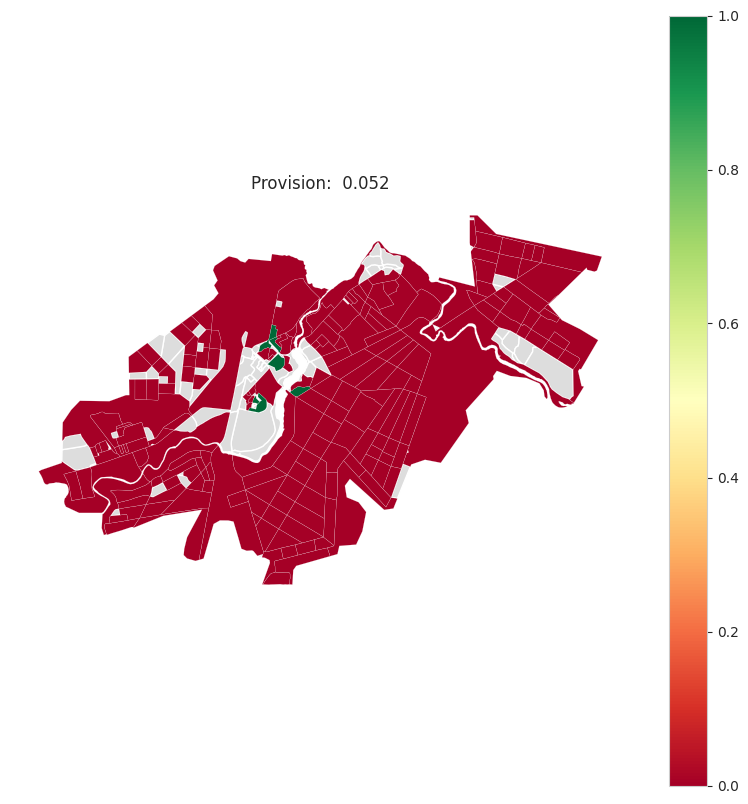

In [ ]:
from blocksnet import Provision, ProvisionMethod
service_type = 'train_station'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)

prov.plot(prov_res)
city.to_pickle("lp_bn_model.pkl")

In [ ]:
city.to_pickle("lp_bn_model.pkl")

Шаг 4. Вычисление центральности, определение морфотипа застройки

In [ ]:
Siversk = City.from_pickle("/content/lp_bn_model.pkl")
Siversk

print(Siversk)

CRS : EPSG:32636
Blocks : 351
Service types : 0/66
Buildings : 0
Services : 0



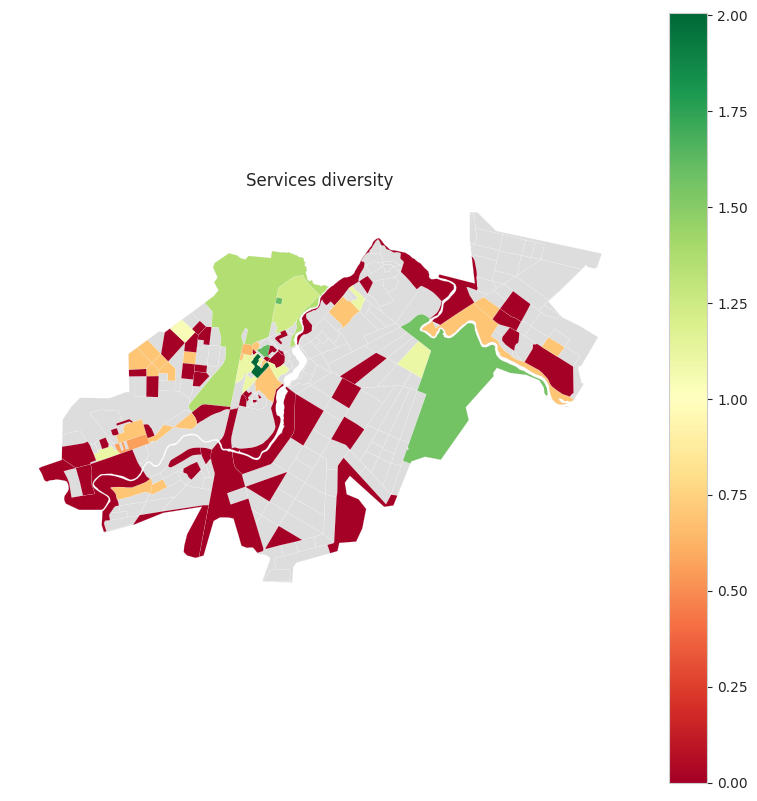

In [ ]:
from blocksnet import Diversity

diversity = Diversity(city_model=Siversk)
result_devirsity = diversity.calculate()

result_devirsity

Diversity.plot(result_devirsity, figsize =(10,10)) #оценка разнообразия сервисов

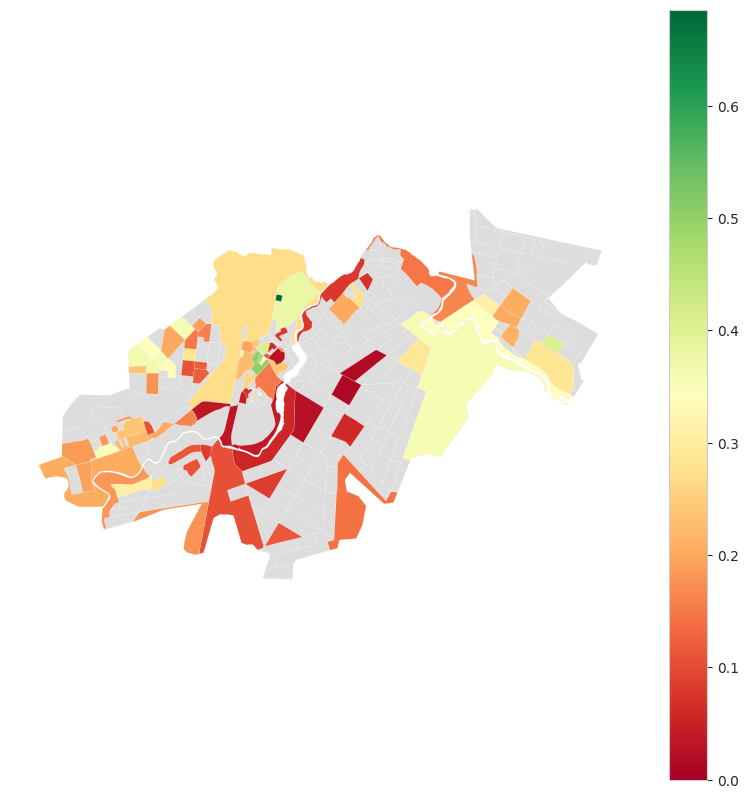

In [ ]:
from blocksnet import Centrality, PopulationCentrality

centrality = Centrality(city_model=Siversk)
result_centrality = centrality.calculate()

result_centrality
Centrality.plot(result_centrality, figsize =(10,10))

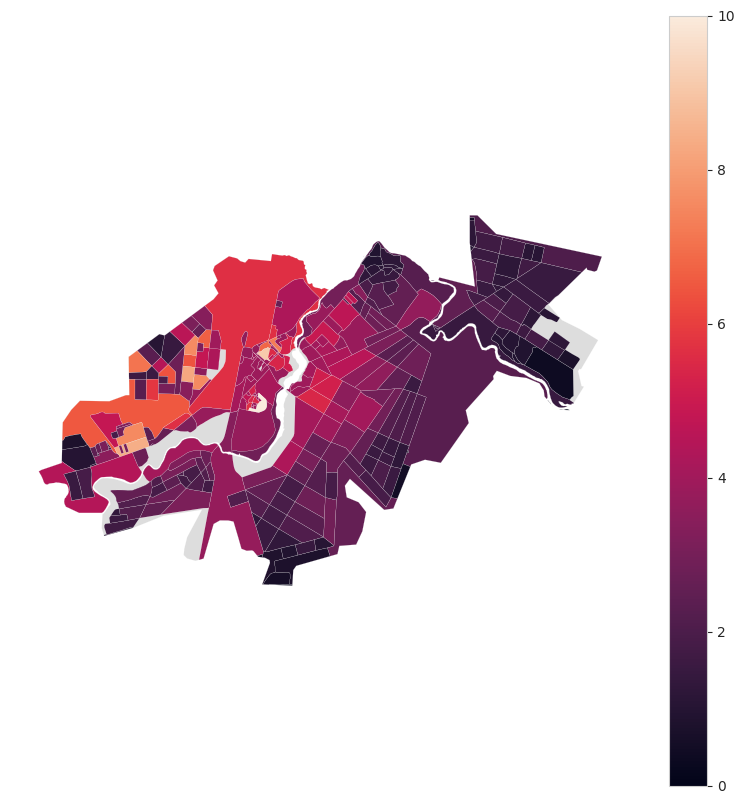

In [ ]:
centrality_population = PopulationCentrality(city_model=Siversk)

result_centrlity_population = centrality_population.calculate()

result_centrlity_population
PopulationCentrality.plot(result_centrlity_population, figsize =(10,10))

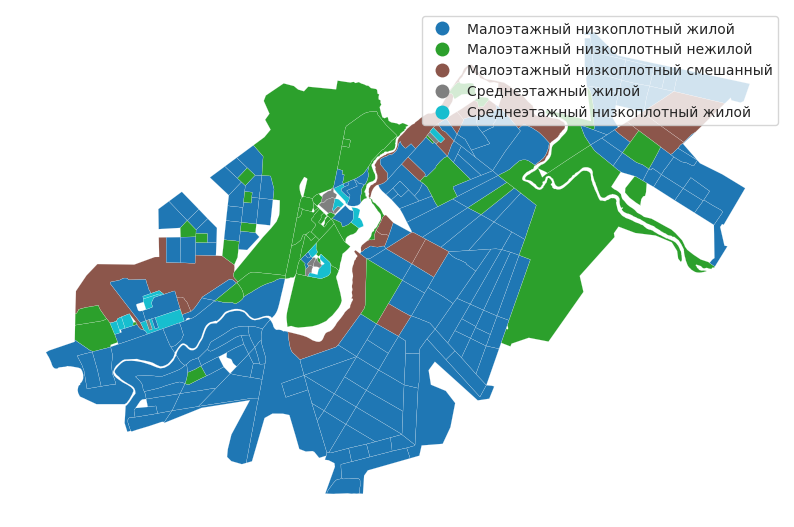

In [ ]:
from blocksnet import Spacematrix

spacematrix = Spacematrix(city_model=Siversk)
result_spacematrix = spacematrix.calculate()

result_spacematrix
Spacematrix.plot(result_spacematrix, figsize =(10,10))